# **STIB-MIVB Network Map**

In [1]:
import numpy as np
import pandas as pd
import geopandas as gpd
import folium as fl
import matplotlib.pyplot as plt
import warnings

warnings.simplefilter(action= 'ignore', category = UserWarning)

## (1) Load & Preprocess Data

In [2]:
# load lines & stops from shapefile, as GeoDataFrame (gdf)

stib_lines = gpd.read_file("stib_data/network/ACTU_LINES.shp")
stib_stops = gpd.read_file("stib_data/network/ACTU_STOPS.shp")

In [3]:
# line gdf attributes

stib_lines.head(3)

,LIGNE,VARIANTE,COLOR_HEX,Date_debut,Date_fin,geometry
0,001m,1,#C4008F,01/09/2021,06/03/2022,"LINESTRING Z (146633.500 170956.400 0.000, 146..."
1,001m,2,#C4008F,01/09/2021,06/03/2022,"LINESTRING Z (156746.700 170167.000 0.000, 156..."
2,002m,1,#F57000,01/09/2021,06/03/2022,"LINESTRING Z (147305.500 172526.900 0.000, 147..."


In [4]:
# stop gdf attributes

stib_stops.head(3)

,Code_Ligne,Variante,succession,stop_id,descr_fr,descr_nl,alpha_fr,alpha_nl,coord_x,coord_y,mode,numero_lig,terminus,geometry
0,012b,1,1,9600B,BRUSSELS AIRPORT,BRUSSELS AIRPORT,Brussels Airport,Brussels Airport,157950.0,176429.0,B,12,BRUSSELS CITY,POINT (157950.000 176429.000)
1,012b,1,2,3017,BOURGET,BOURGET,Bourget,Bourget,154334.0,174200.0,B,12,BRUSSELS CITY,POINT (154334.000 174200.000)
2,012b,1,3,5048,DA VINCI,DA VINCI,Da Vinci,Da Vinci,152934.0,173976.0,B,12,BRUSSELS CITY,POINT (152934.000 173976.000)


In [5]:
# check for null values

print(f'Null Values in Lines GDF: {stib_lines.isna().sum().max()}')
print(f'Null Values in Stops GDF: {stib_stops.isna().sum().max()}')

Null Values in Lines GDF: 0
Null Values in Stops GDF: 0


In [6]:
# clean lines gdf

stib_lines = stib_lines.rename(
    str.lower, 
    axis = 'columns'
).rename(
    columns = {
        'ligne': 'line_code', 
        'variante': 'direction'
    }
)

In [7]:
# clean stops gdf

stib_stops = stib_stops.rename(
    str.lower, 
    axis = 'columns'
).drop(
    columns = ['descr_nl', 'alpha_fr', 'alpha_nl'], 
    axis = 1
).rename(
    columns = {
        'code_ligne': 'line_code', 
        'variante': 'direction',
        'succession': 'stop_seq',
        'descr_fr': 'stop_name',
        'mode': 'vehicle',
        'numero_lig': 'line',
        'terminus': 'end_stop'
    }
)

# map vehicle names for better readability

for index, row in stib_stops.iterrows():
    if row['vehicle'] == 'B':
        stib_stops.at[index,'vehicle'] ='BUS'
    elif row['vehicle'] == 'T':
        stib_stops.at[index,'vehicle'] = 'TRAM'
    elif row['vehicle'] == 'M':
        stib_stops.at[index,'vehicle'] = 'METRO'
    else:
        pass

In [8]:
# get distinct stops & lines

distinct_stop_lines = stib_stops[['line_code', 'vehicle', 'line']].drop_duplicates()
distinct_lines = stib_lines[['line_code', 'color_hex']].drop_duplicates()

In [9]:
# total number of line types by vehicle

distinct_stop_lines.vehicle.value_counts()

BUS      65
TRAM     18
METRO     4
Name: vehicle, dtype: int64

In [10]:
# distinct stop stations

print(f'Total distinct stop stations: {len(stib_stops.stop_name.drop_duplicates())}')

Total distinct stop stations: 894


In [11]:
# get additional attributes for lines gdf

stib_lines = stib_lines.merge(
    distinct_stop_lines, 
    on = 'line_code', how = 'inner'
)[[
    'vehicle', 
    'line', 
    'direction', 
    'date_debut', 
    'date_fin', 
    'color_hex', 
    'geometry'
]]

# get additional attributes for stops gdf

stib_stops = stib_stops.merge(
    distinct_lines, 
    on = 'line_code', how = 'inner'
)[[
    'vehicle', 
    'line', 
    'direction', 
    'stop_seq', 
    'stop_id', 
    'stop_name',
    'color_hex',
    'end_stop',
    'geometry'
]]

In [12]:
# lines gdf attributes (after preprocessing)

stib_lines.head(3)

,vehicle,line,direction,date_debut,date_fin,color_hex,geometry
0,METRO,1,1,01/09/2021,06/03/2022,#C4008F,"LINESTRING Z (146633.500 170956.400 0.000, 146..."
1,METRO,1,2,01/09/2021,06/03/2022,#C4008F,"LINESTRING Z (156746.700 170167.000 0.000, 156..."
2,METRO,2,1,01/09/2021,06/03/2022,#F57000,"LINESTRING Z (147305.500 172526.900 0.000, 147..."


In [13]:
# stops gdf attributes (after preprocessing)

stib_stops.head(3)

,vehicle,line,direction,stop_seq,stop_id,stop_name,color_hex,end_stop,geometry
0,BUS,12,1,1,9600B,BRUSSELS AIRPORT,#338C26,BRUSSELS CITY,POINT (157950.000 176429.000)
1,BUS,12,1,2,3017,BOURGET,#338C26,BRUSSELS CITY,POINT (154334.000 174200.000)
2,BUS,12,1,3,5048,DA VINCI,#338C26,BRUSSELS CITY,POINT (152934.000 173976.000)


## (2a) Visualize STIB Network Map (filter: all stops/lines)

In [14]:
# store google maps tile layer incase it's needed

basemaps = {
    'Google Maps': fl.TileLayer(
        tiles = 'https://mt1.google.com/vt/lyrs=m&x={x}&y={y}&z={z}',
        attr = 'Google',
        name = 'Google Maps',
        overlay = True,
        control = True
    )}

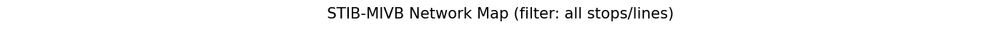

In [15]:
# plot interactive map for stib network (filter: all stops/lines)

fig, ax = plt.subplots(1, 1, figsize = (17.5, 0.01))
ax.set_title('STIB-MIVB Network Map (filter: all stops/lines)', size = 15)
ax.axis("off")
plt.show()

map_lines = stib_lines.explore(
    name = "All Lines", 
    tiles = 'CartoDB positron',
    color = stib_lines.color_hex.tolist()
)
map_all = stib_stops.explore(
    m = map_lines,
    name = "All Stops", 
    tiles = 'CartoDB positron',
    color = stib_stops.color_hex.tolist(), 
    marker_type = 'circle', 
    marker_kwds = {
        'radius': 25, 
        'fill': True
    }
)
fl.LayerControl().add_to(map_all)

map_all

In [16]:
# save map into html file

map_all.save('stib_network_map_filter_all_lines_stops.html')

## (2b) Visualize STIB Network Map (filter: individual lines)

In [17]:
# get lat & lon in a format usable for folium circle marker for stops

stib_stops_v2 = stib_stops.to_crs(4326)
stib_stops_v2['lat'] = stib_stops_v2.centroid.y
stib_stops_v2['lon'] = stib_stops_v2.centroid.x

stib_stops_v2.head(3)

,vehicle,line,direction,stop_seq,stop_id,stop_name,color_hex,end_stop,geometry,lat,lon
0,BUS,12,1,1,9600B,BRUSSELS AIRPORT,#338C26,BRUSSELS CITY,POINT (4.48176 50.89815),50.898150,4.481761
1,BUS,12,1,2,3017,BOURGET,#338C26,BRUSSELS CITY,POINT (4.43033 50.87815),50.878151,4.430334
2,BUS,12,1,3,5048,DA VINCI,#338C26,BRUSSELS CITY,POINT (4.41044 50.87615),50.876146,4.410439


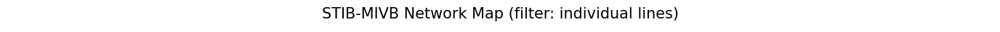

In [18]:
# plot interactive map for stib network (filter: individual lines)

fig, ax = plt.subplots(1, 1, figsize = (17.5, 0.01))
ax.set_title('STIB-MIVB Network Map (filter: individual lines)', size = 15)
ax.axis("off")
plt.show()

map_indiv_lines = fl.Map(
    location = [50.8476, 4.3572],
    tiles = 'CartoDB positron',
    zoom_start = 13,
    control_scale = True
)

for grp_name, df_grp in stib_lines.groupby('line'):
    if grp_name == 1:
        feature_group = fl.FeatureGroup(grp_name, show = True)
    else:
        feature_group = fl.FeatureGroup(grp_name, show = False)
        
    for row in df_grp.itertuples():
        fl.Choropleth(
            geo_data = df_grp, 
            line_color = row.color_hex,
            highlight = True
        ).add_to(feature_group)
        
    for index, data in stib_stops_v2.loc[(stib_stops_v2.line == grp_name)].iterrows():
        fl.Circle(
            location = [data.lat, data.lon], 
            tooltip = data[['vehicle', 'line', 'direction', 'stop_seq', 'stop_name', 'end_stop']].to_dict(), 
            radius = 25, 
            color = data.color_hex, 
            fill = True
        ).add_to(feature_group)
    
    feature_group.add_to(map_indiv_lines)
    
fl.LayerControl(collapsed = False).add_to(map_indiv_lines)
map_indiv_lines

In [19]:
# save map into html file

map_indiv_lines.save('stib_network_map_filter_individual_lines.html')

## End.